# <font color='purple'>dNLS Preprocessing QC statistics </font> 
### October 2024

In [5]:
import os
NOVA_HOME = '/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps'
NOVA_DATA_HOME = '/home/labs/hornsteinlab/Collaboration/MOmaps'
LOGS_PATH = os.path.join(NOVA_DATA_HOME, "outputs/preprocessing/spd/logs/dNLS")
PLOT_PATH = os.path.join(NOVA_HOME, 'src', 'preprocessing', 'notebooks','figures','dNLS')
os.chdir(NOVA_HOME)
import pandas as pd
import numpy as np
# plt.rcParams["image.cmap"] = "Set1"
import contextlib
import io
from IPython.display import display, Javascript

from tools.preprocessing_tools.qc_reports.qc_utils import log_files_qc, run_validate_folder_structure, display_diff, sample_and_calc_variance, \
                                                show_site_survival_dapi_brenner, show_site_survival_dapi_cellpose, \
                                                show_site_survival_dapi_tiling, show_site_survival_target_brenner, \
                                                calc_total_sums, plot_filtering_heatmap, show_total_sum_tables, \
                                                plot_cell_count, plot_catplot, plot_hm_combine_batches, plot_hm, \
                                                run_calc_hist_new
                                                
from tools.preprocessing_tools.qc_reports.qc_config import dnls_panels, dnls_markers, dnls_marker_info, dnls_cell_lines, \
                                                dnls_cell_lines_to_cond, dnls_cell_lines_for_disp, reps, \
                                                dnls_line_colors, dnls_lines_order, dnls_custom_palette, \
                                                dnls_expected_dapi_raw, markers, custom_palette

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [6]:
# choose batches
batches = [f'batch{i}' for i in range(3,6)]
batches

['batch3', 'batch4', 'batch5']

In [26]:
df = log_files_qc(LOGS_PATH, only_wt_cond=False, batches=batches)
# we are not using the wt line eventually
df = df[df.cell_line != 'WT']

df_dapi = df[df.marker=='DAPI']
df_target = df[df.marker!='DAPI']
# we need to match between the raw marker name (TDP43) and the processed marker name (TDP43N / TDP43B)
df_target.loc[df_target['marker'] == 'TDP43', 'marker'] += df_target['panel'].str.replace('panel', '')

reading logs of batch4
reading logs of batch3
reading logs of batch5

Total of 3 files were read.
Before dup handeling  (74261, 22)
After duplication removal #1: (74261, 23)
After duplication removal #2: (74261, 23)


## Actual Files Validation

### Raw Files Validation

1. How many site **tiff** files do we have in each folder?
2. Are all existing files valid? (tif, at least 2049kB, not corrupetd)

batch3
Folder structure is invalid. Missing 1 paths:
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/deltaNLS_sort/batch3/TDP43/panelN
No bad files are found.
Total Sites:  17200


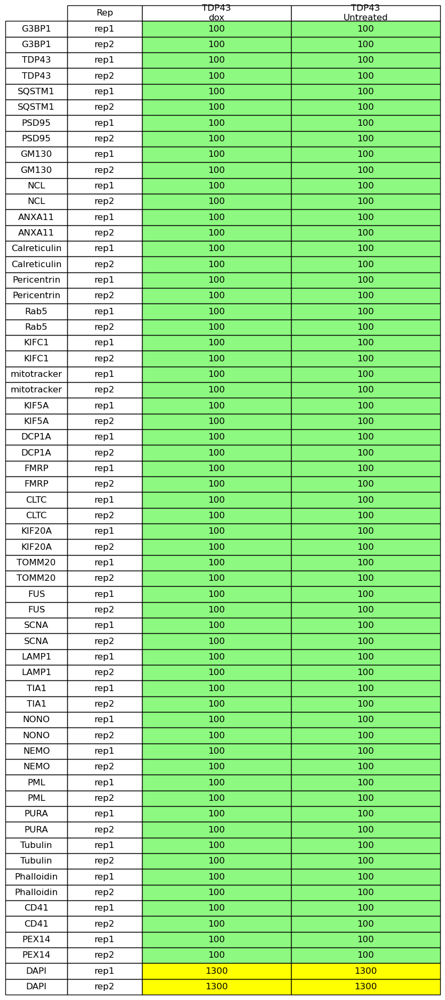

batch4
Folder structure is invalid. Missing 1 paths:
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/deltaNLS_sort/batch4/TDP43/panelN
No bad files are found.
Total Sites:  17200


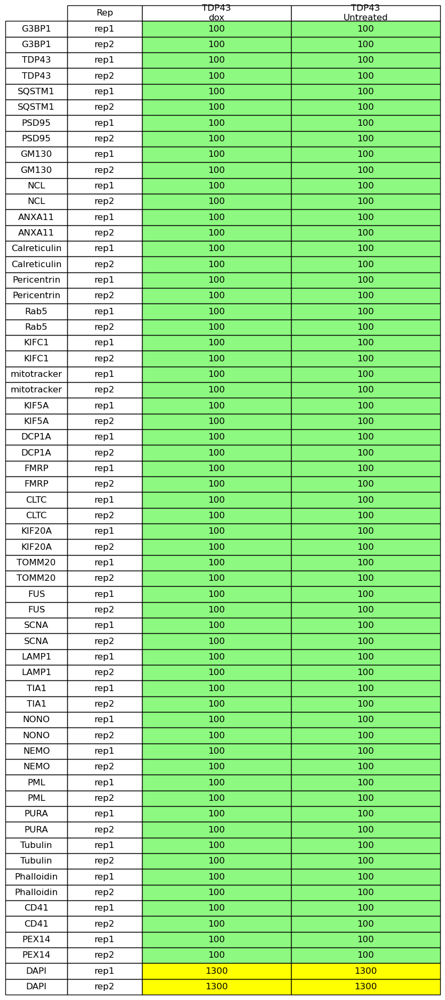

batch5
Folder structure is valid.
No bad files are found.
Total Sites:  18000


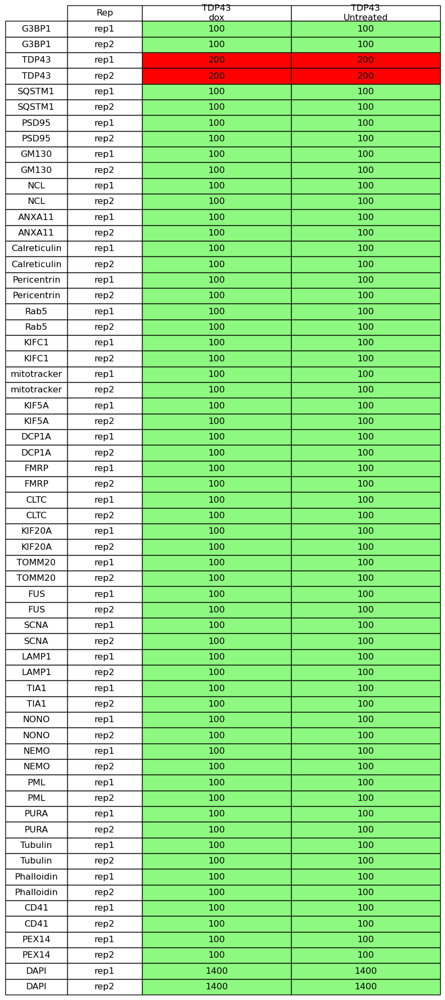

In [9]:

root_directory_raw = os.path.join(NOVA_DATA_HOME, 'input', 'images', 'raw', 'SpinningDisk','deltaNLS_sort')

raws = run_validate_folder_structure(root_directory_raw, False, dnls_panels, dnls_markers.copy(),PLOT_PATH, dnls_marker_info,
                                    dnls_cell_lines_to_cond, reps, dnls_cell_lines_for_disp, dnls_expected_dapi_raw,
                                     batches=batches, fig_width=3)

### Processed Files Validation

1. How many site **npy** files do we have in each folder? -> How many sites survived the pre-processing?
2. Are all existing files valid? (at least 100kB, npy not corrupted)

batch3
Folder structure is invalid. Missing 2 paths:
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/deltaNLS/batch3/TDP43/dox/TDP43N
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/deltaNLS/batch3/TDP43/Untreated/TDP43N
No bad files are found.
Total Sites:  16755


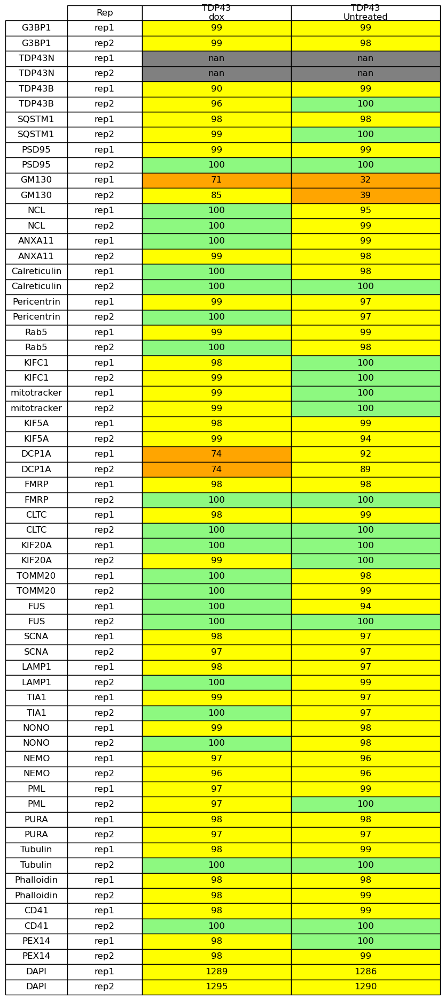

batch4
Folder structure is invalid. Missing 2 paths:
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/deltaNLS/batch4/TDP43/dox/TDP43N
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/deltaNLS/batch4/TDP43/Untreated/TDP43N
No bad files are found.
Total Sites:  16508


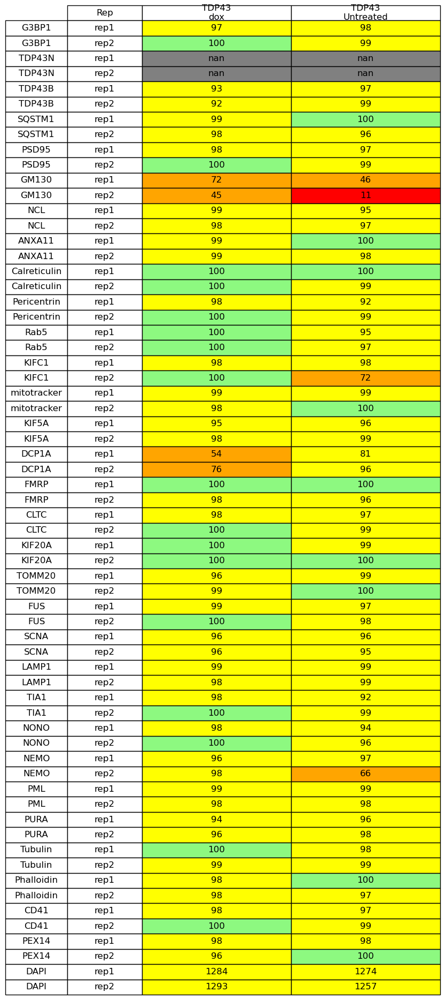

batch5
Folder structure is valid.
No bad files are found.
Total Sites:  17547


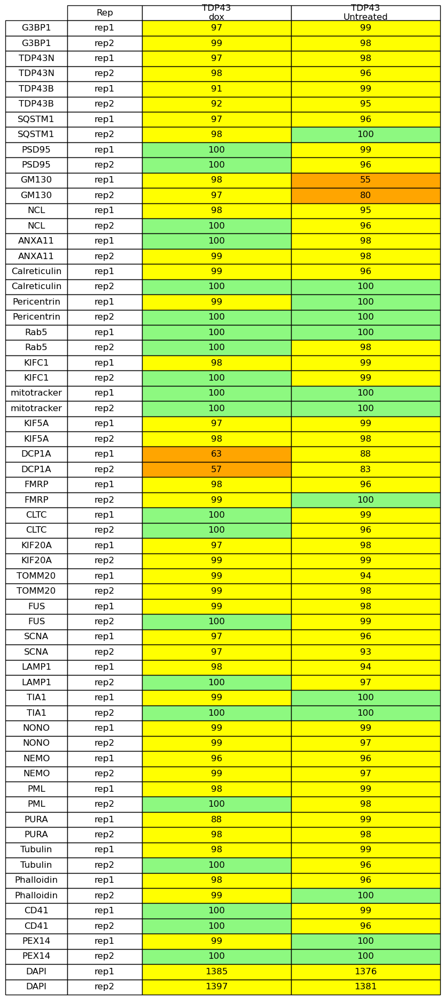

In [10]:
root_directory_proc = os.path.join(NOVA_DATA_HOME, 'input', 'images', 'processed', 'spd2',
                              'SpinningDisk','deltaNLS')
procs = run_validate_folder_structure(root_directory_proc, True, dnls_panels, dnls_markers,PLOT_PATH,dnls_marker_info,
                                    dnls_cell_lines_to_cond, reps, dnls_cell_lines_for_disp, dnls_expected_dapi_raw,
                                     batches=batches, fig_width=3)

### Difference between Raw and Processed

batch3


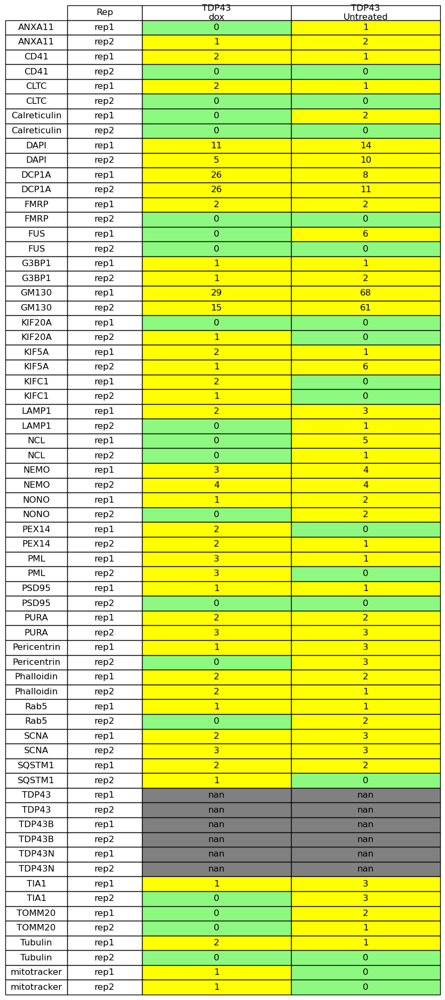

batch4


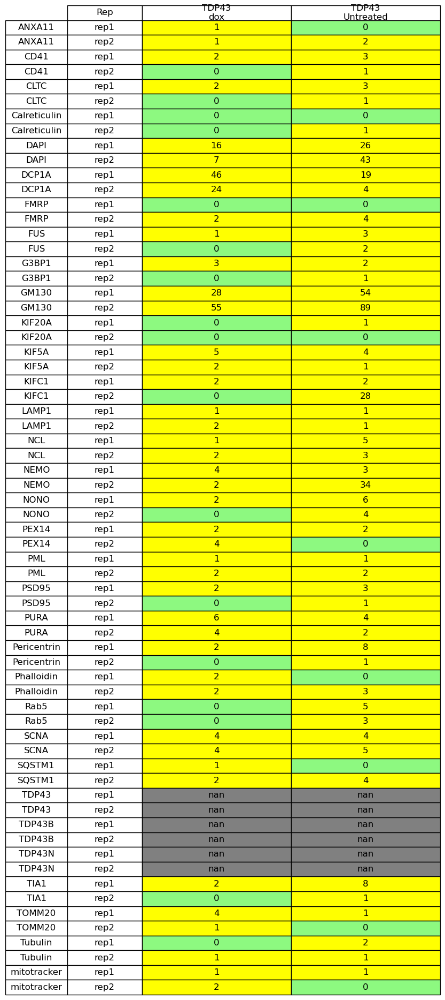

batch5


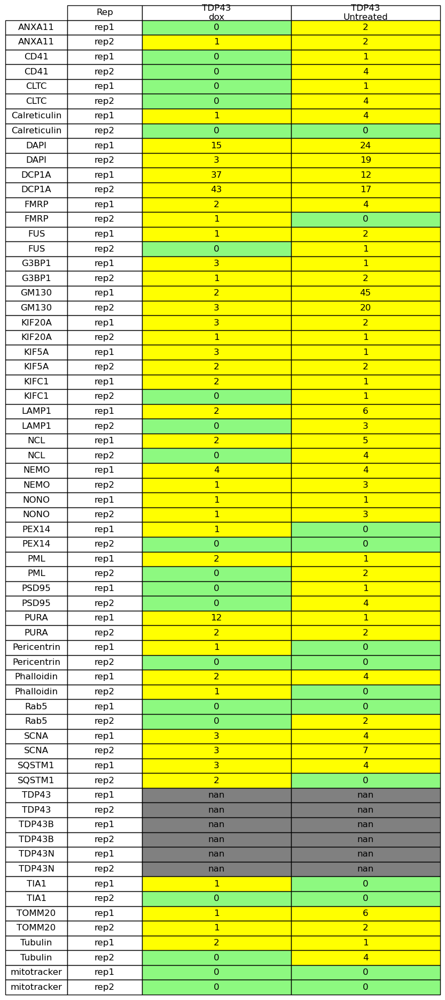

In [11]:
display_diff(batches, raws, procs, PLOT_PATH, fig_width=3)

### Variance in each batch (of processed files)

In [14]:
for batch in batches:
    with contextlib.redirect_stdout(io.StringIO()):
        var = sample_and_calc_variance(root_directory_proc, batch, 
                                       sample_size_per_markers=200, cond_count=2, rep_count=len(reps), 
                                       num_markers=len(dnls_markers))
    print(f'{batch} var: ',var)

batch3 var:  0.010357440534791738
batch4 var:  0.010663615289945838
batch5 var:  0.01020901013294272


## Preprocessing Filtering qc
By order of filtering

### 1. % site survival after Brenner on DAPI channel
Percentage out of the total sites

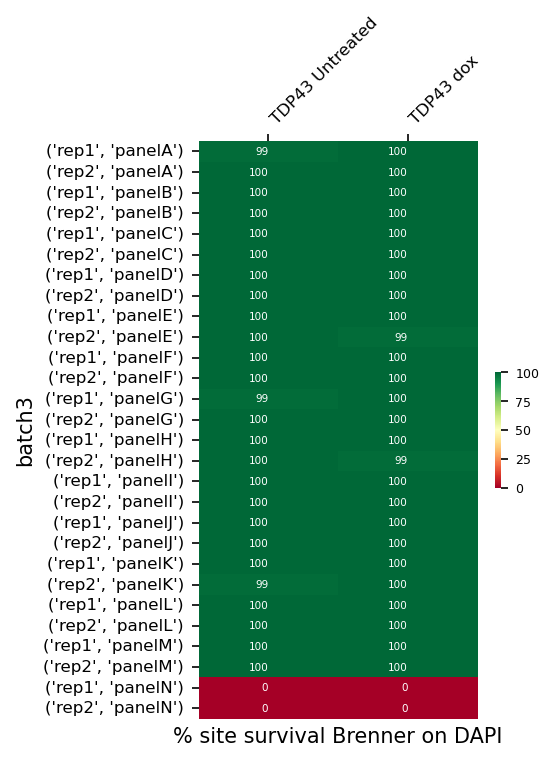

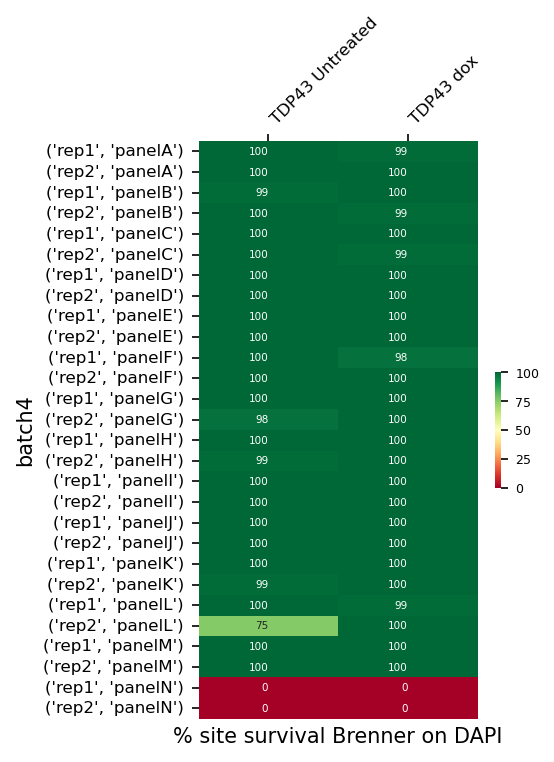

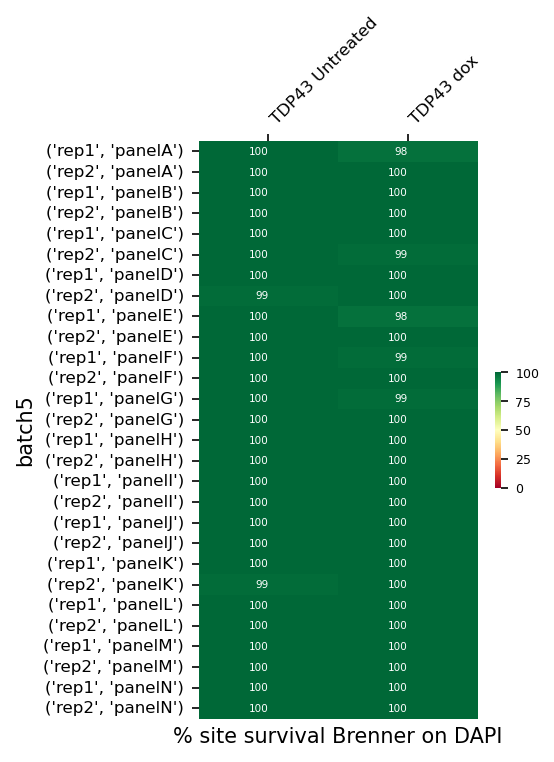

In [29]:
dapi_filter_by_brenner = show_site_survival_dapi_brenner(df_dapi,batches, dnls_line_colors, dnls_panels, reps, figsize=(3,5))

### 2. % Site survival after Cellpose
Percentage out of the sites that passed the previous filter. In parenthesis are absolute values.

**A site will be filtered out if Cellpose found 0 cells in it.**

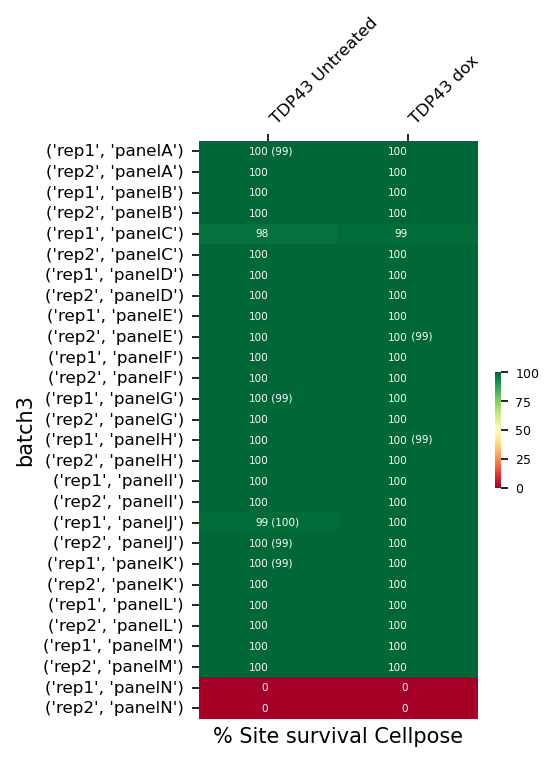

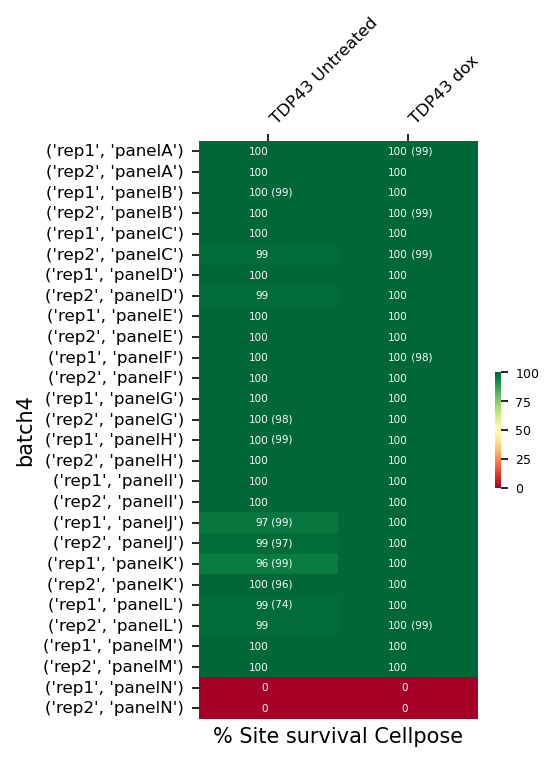

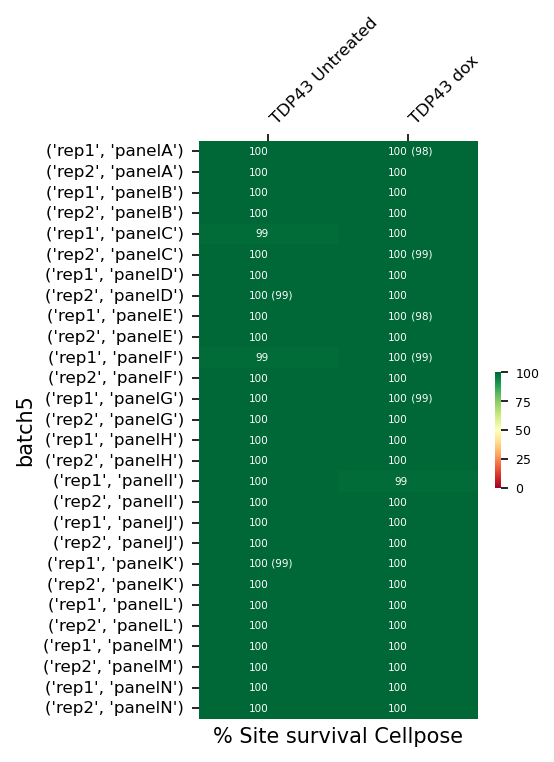

In [30]:
dapi_filter_by_cellpose = show_site_survival_dapi_cellpose(df_dapi, batches, dapi_filter_by_brenner, dnls_line_colors, 
                                                           dnls_panels, reps, figsize=(3,5))

### 3. % Site survival by tiling
Percentage out of the sites that passed the previous filter. In parenthesis are absolute values.

**A site will be filtered out if after tiling, no tile is containing at least one whole cell that Cellpose detected.**

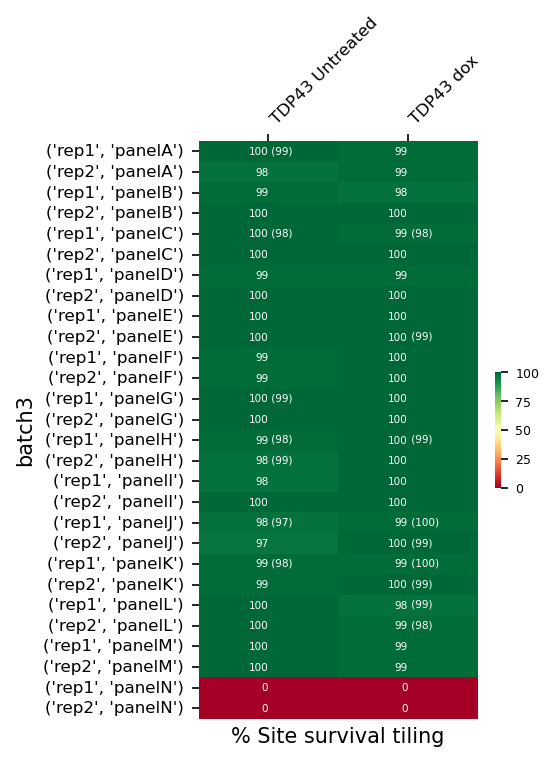

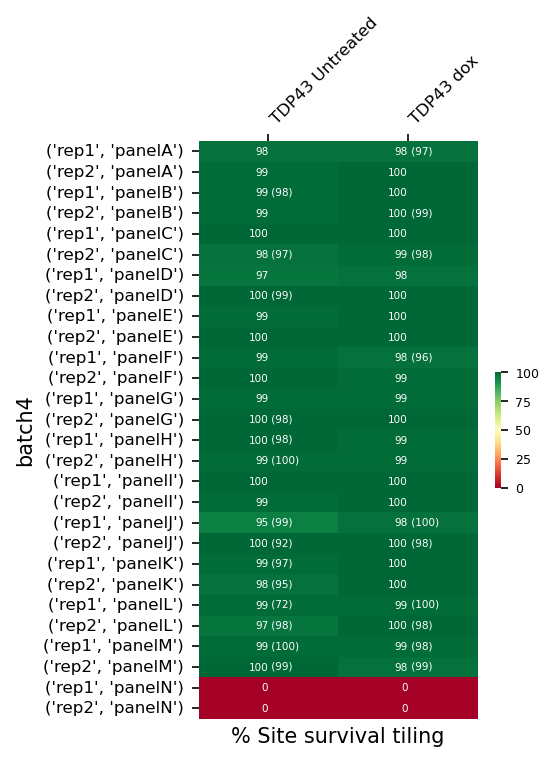

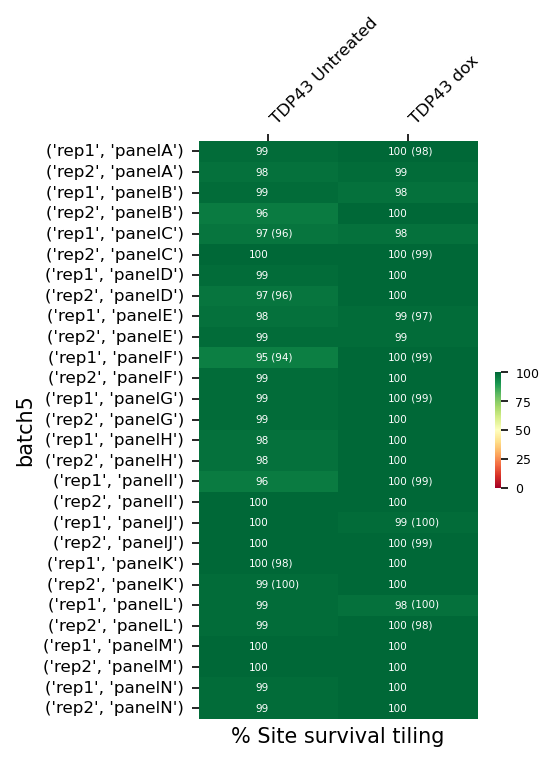

In [31]:
dapi_filter_by_tiling=show_site_survival_dapi_tiling(df_dapi, batches, dapi_filter_by_cellpose, dnls_line_colors, dnls_panels, 
                                                     reps, figsize=(3,5))

### 4. % Site survival after Brenner on target channel
Percentage out of the sites that passed the previous filter. In parenthesis are absolute values (if different than the percentages).

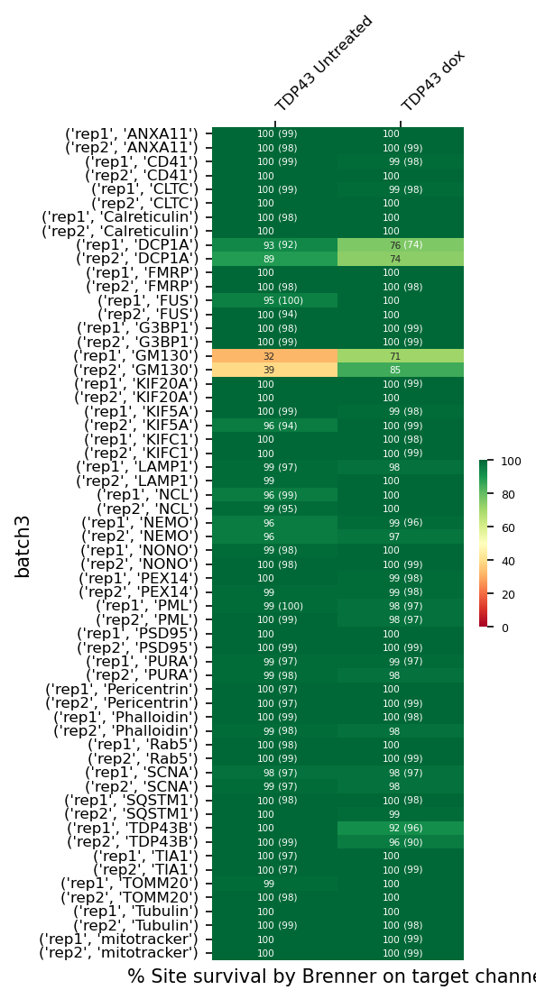

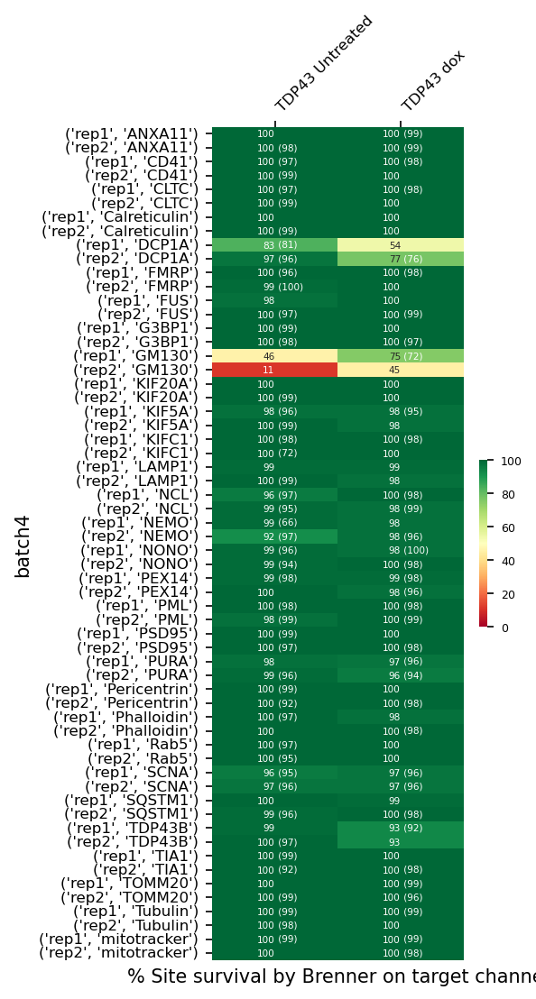

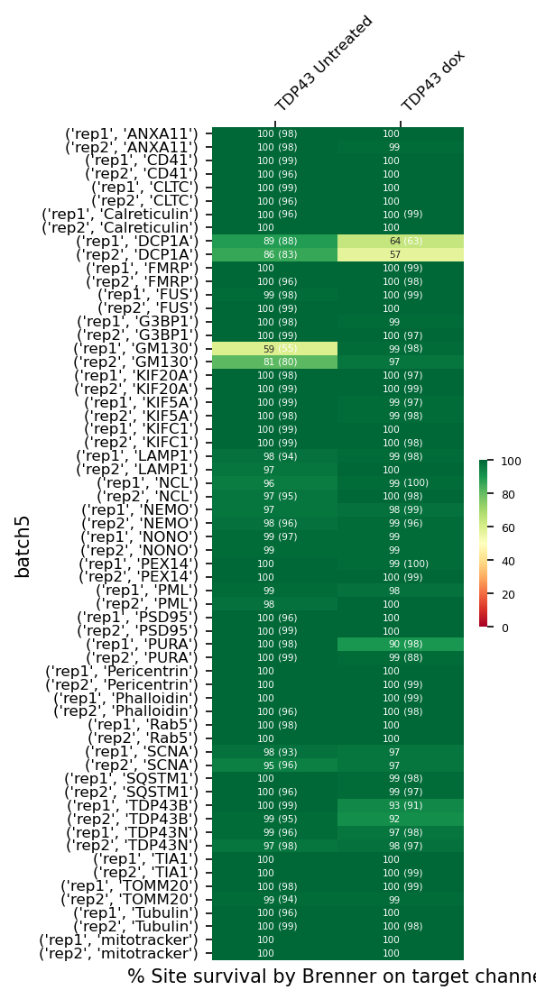

In [33]:
show_site_survival_target_brenner(df_dapi, df_target, dapi_filter_by_tiling, dnls_markers,figsize=(3,8))

## Statistics About the Processed Files

In [34]:
names = ['Total number of tiles', 'Total number of whole cells']
stats = ['n_valid_tiles','site_whole_cells_counts_sum','site_cell_count','site_cell_count_sum']
total_sum = calc_total_sums(df_target, df_dapi, stats, dnls_markers)

### Total tiles

In [35]:
markers_for_dnls = markers.copy()
markers_for_dnls.remove('TIA1')
markers_for_dnls += ['TDP43B']
total_sum[total_sum.marker.isin(markers_for_dnls)].n_valid_tiles.sum()

305407

### Total whole nuclei in tiles

In [38]:
total_sum[total_sum.marker =='DAPI'].site_whole_cells_counts_sum.sum()

125144.0

### Total nuclei in sites

In [39]:
total_sum[total_sum.marker =='DAPI'].site_cell_count.sum()

328656.0

In [40]:
show_total_sum_tables(total_sum)

,n_valid_tiles,% valid tiles,site_whole_cells_counts_sum,site_cell_count
batch3,,,,
count,172.000000,172.000000,172.000000,172.000000
mean,721.872093,7.218721,814.656977,2113.180233
std,92.703615,0.927036,103.078088,284.357791
min,259.000000,2.590000,298.000000,727.000000
25%,677.750000,6.777500,774.000000,1944.000000
50%,722.000000,7.220000,811.000000,2119.500000
75%,786.250000,7.862500,891.000000,2314.000000
max,891.000000,8.910000,1006.000000,2647.000000
sum,124162.000000,NaN,140121.000000,363467.000000


,n_valid_tiles,% valid tiles,site_whole_cells_counts_sum,site_cell_count
batch4,,,,
count,172.000000,172.000000,172.000000,172.000000
mean,656.790698,6.567907,734.970930,1961.279070
std,122.838659,1.228387,137.525646,362.919164
min,87.000000,0.870000,98.000000,262.000000
25%,576.000000,5.760000,640.250000,1756.500000
50%,667.000000,6.670000,745.000000,1988.000000
75%,748.000000,7.480000,827.000000,2181.000000
max,887.000000,8.870000,993.000000,2613.000000
sum,112968.000000,NaN,126415.000000,337340.000000


,n_valid_tiles,% valid tiles,site_whole_cells_counts_sum,site_cell_count
batch5,,,,
count,180.000000,180.000000,180.000000,180.000000
mean,676.266667,6.762667,761.888889,1990.822222
std,100.419044,1.004190,112.137380,305.698342
min,327.000000,3.270000,371.000000,982.000000
25%,603.000000,6.030000,687.000000,1760.250000
50%,700.000000,7.000000,784.000000,2059.500000
75%,751.500000,7.515000,842.750000,2198.000000
max,892.000000,8.920000,1013.000000,2540.000000
sum,121728.000000,NaN,137140.000000,358348.000000


,n valid tiles,% valid tiles,site_whole_cells_counts_sum,site_cell_count
All batches,,,,
count,524.000000,524.000000,524.000000,5.240000e+02
mean,684.843511,6.848435,770.374046,2.021288e+03
std,109.223814,1.092238,122.652197,3.252182e+02
min,87.000000,0.870000,98.000000,2.620000e+02
25%,618.000000,6.180000,698.000000,1.817750e+03
50%,698.500000,6.985000,788.500000,2.068000e+03
75%,762.000000,7.620000,851.000000,2.251500e+03
max,892.000000,8.920000,1013.000000,2.647000e+03
sum,358858.000000,NaN,403676.000000,1.059155e+06


### Show Total Tile Counts
For each batch, cell line, replicate and markerTotal number of tiles

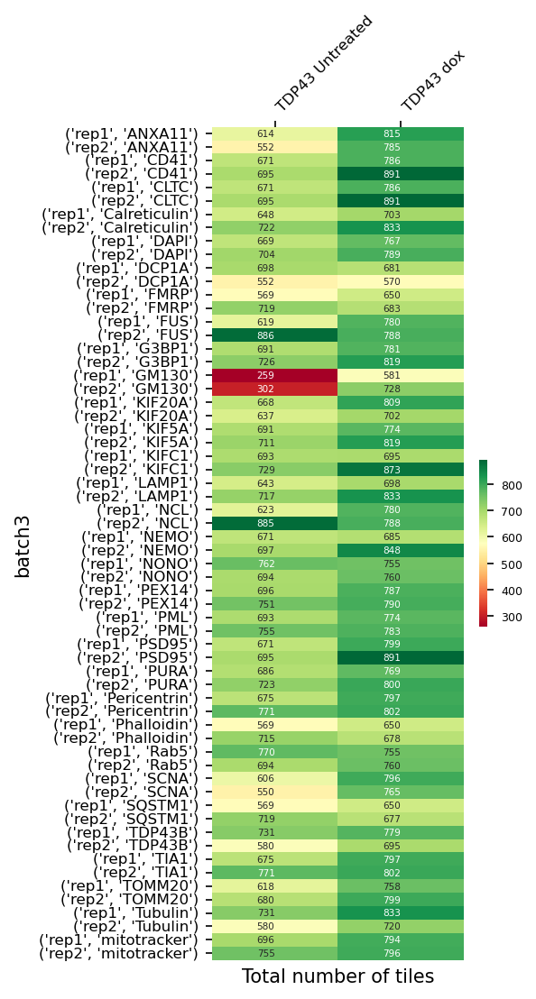

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_reports/qc_utils.py:396: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_reports/qc_utils.py:396: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)


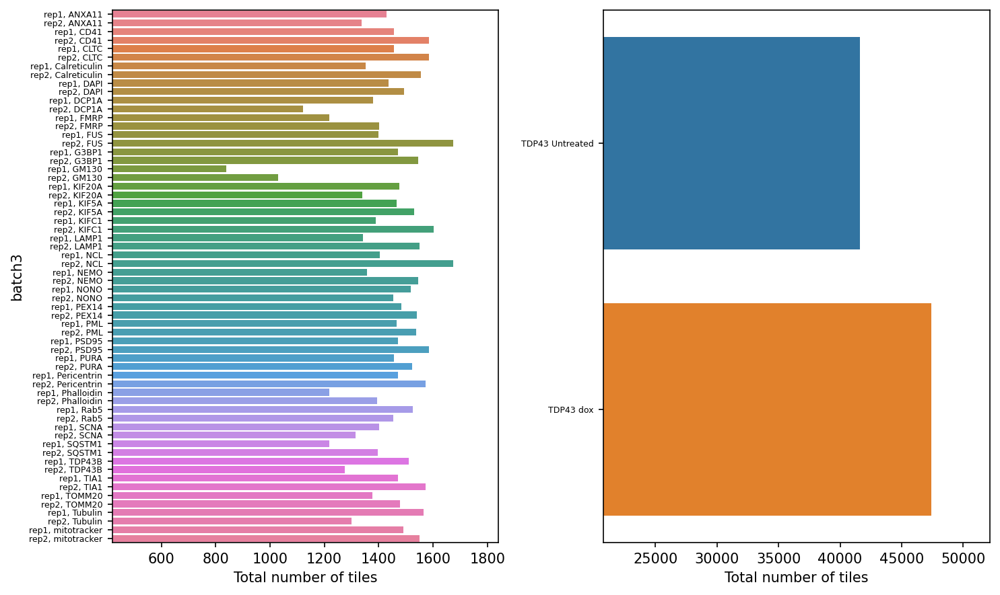

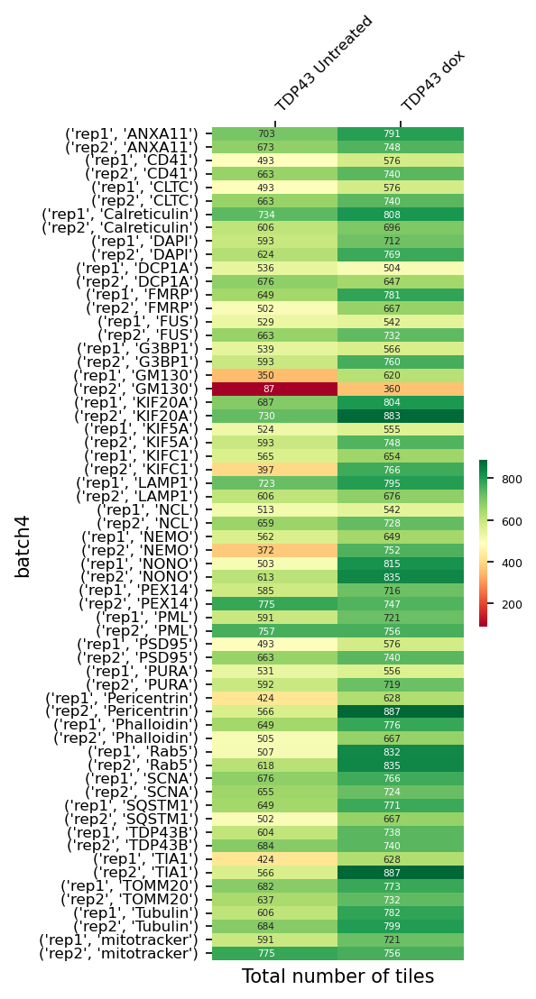

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_reports/qc_utils.py:396: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_reports/qc_utils.py:396: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)


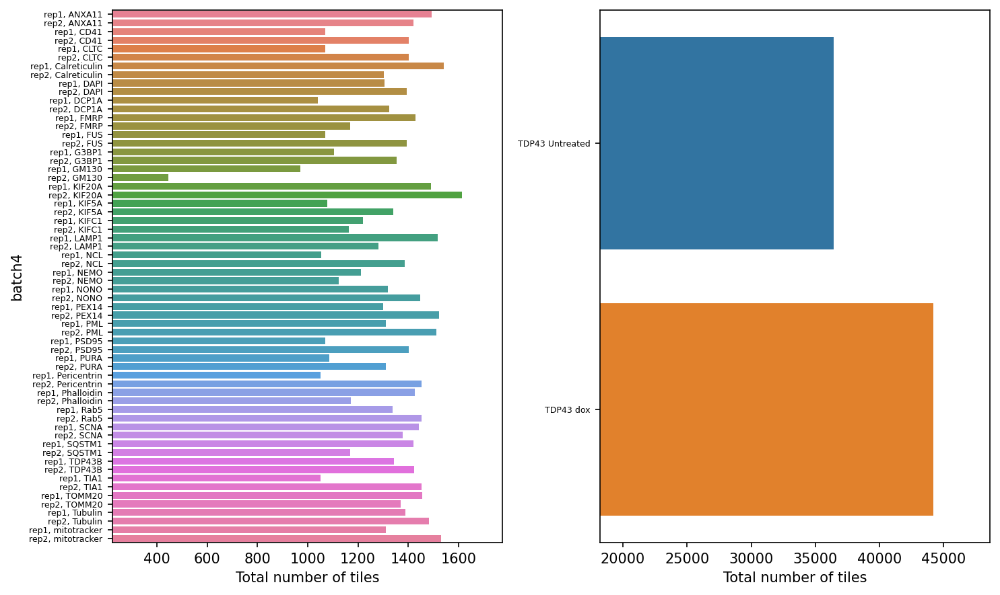

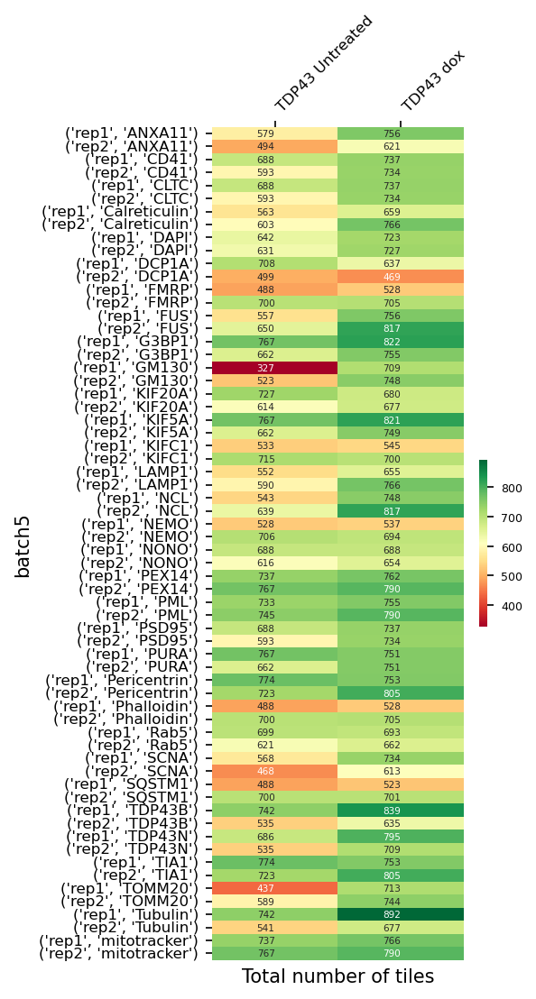

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_reports/qc_utils.py:396: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_reports/qc_utils.py:396: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)


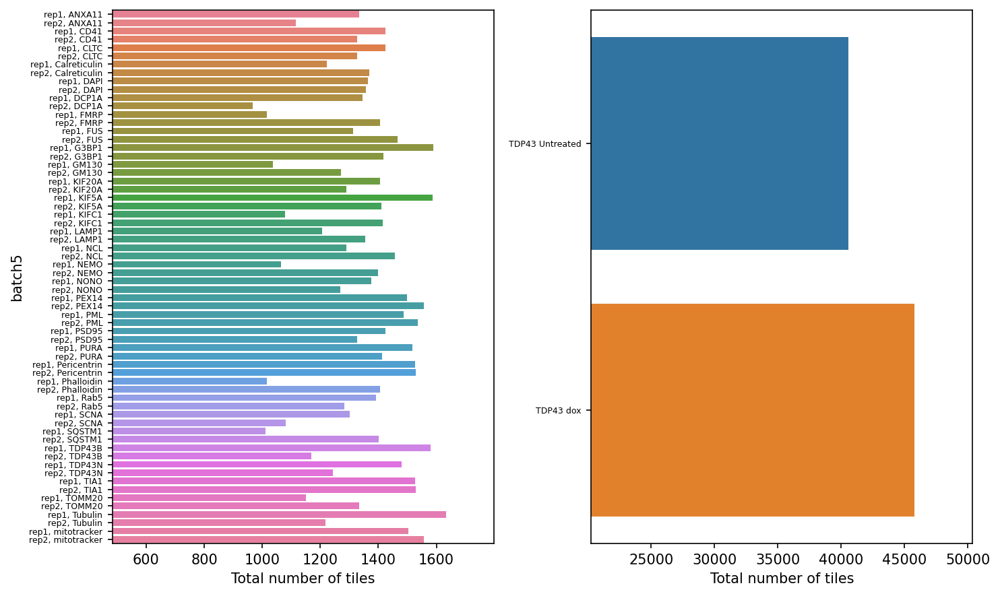

In [42]:
to_heatmap = total_sum.rename(columns={'n_valid_tiles':'index'})
plot_filtering_heatmap(to_heatmap, extra_index='marker', vmin=None, vmax=None,
                      xlabel = 'Total number of tiles', show_sum=True, figsize=(3,8))

### Show Total Whole Cell Counts
For each batch, cell line, replicate and markerTotal number of tiles

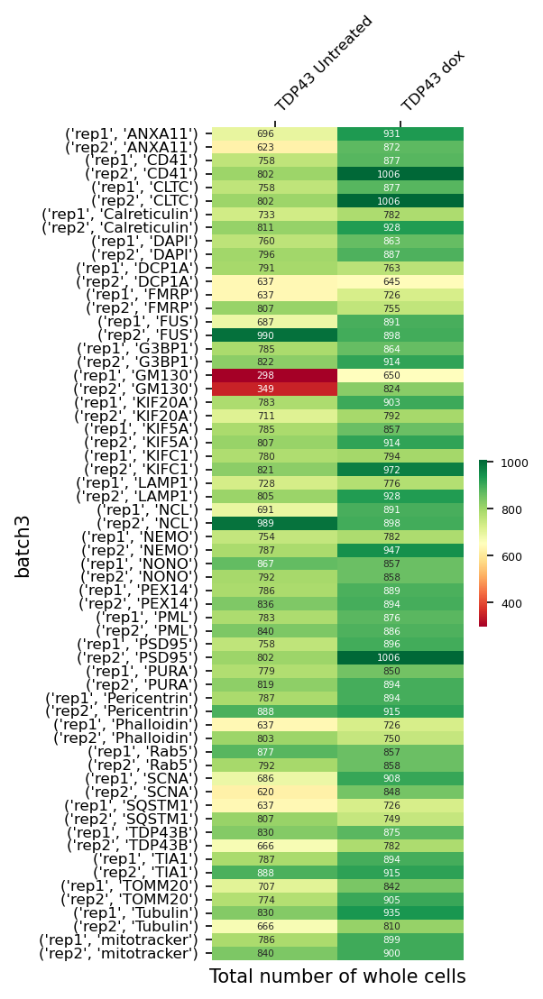

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_reports/qc_utils.py:396: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_reports/qc_utils.py:396: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)


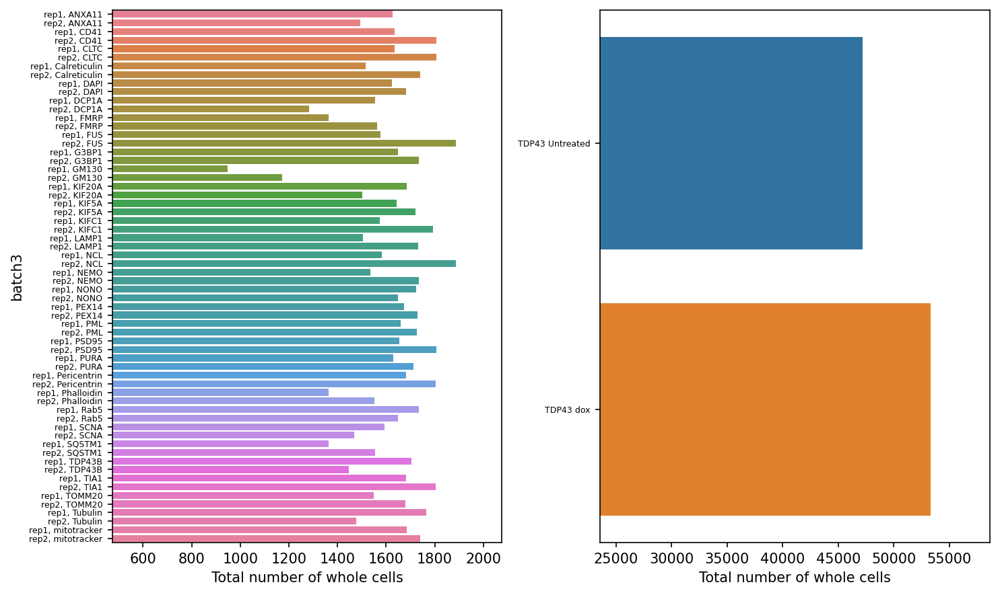

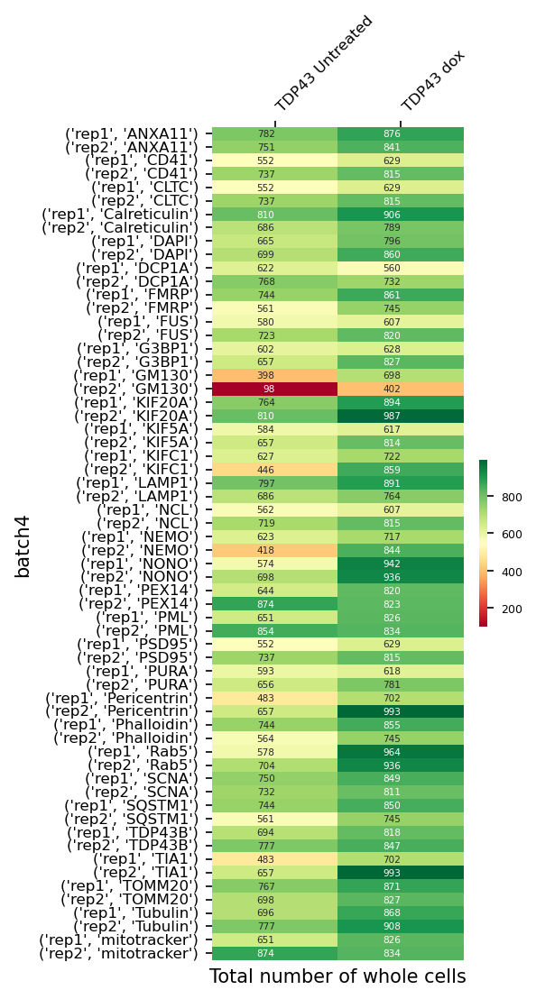

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_reports/qc_utils.py:396: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_reports/qc_utils.py:396: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)


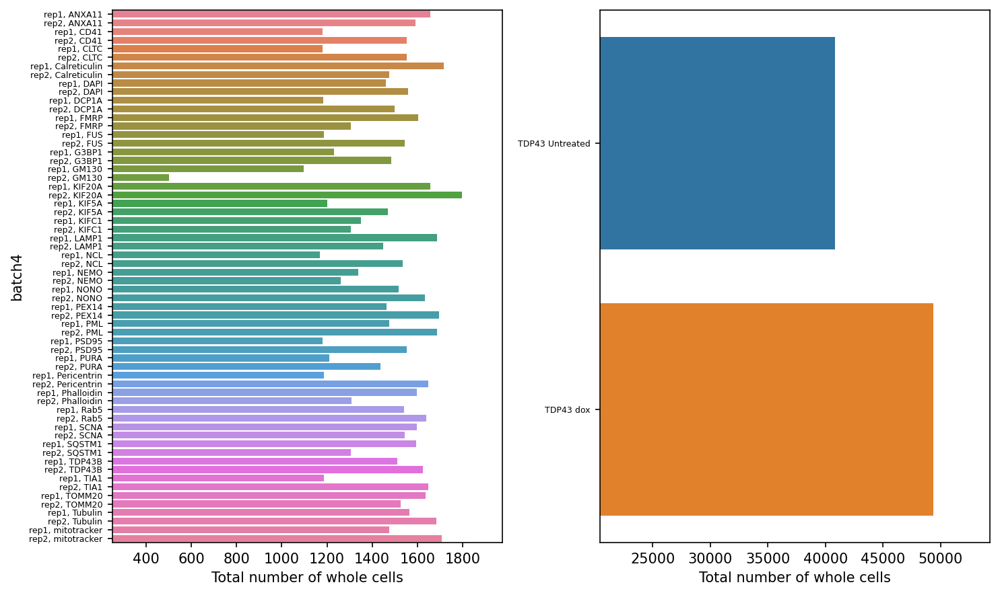

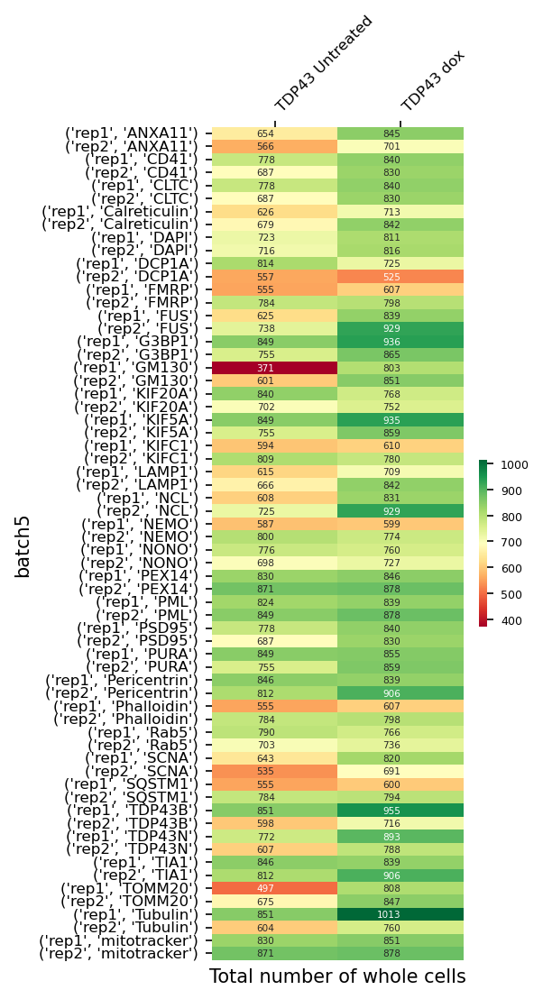

/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_reports/qc_utils.py:396: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)
/home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/tools/preprocessing_tools/qc_reports/qc_utils.py:396: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(ax.get_yticklabels(), fontsize=6)


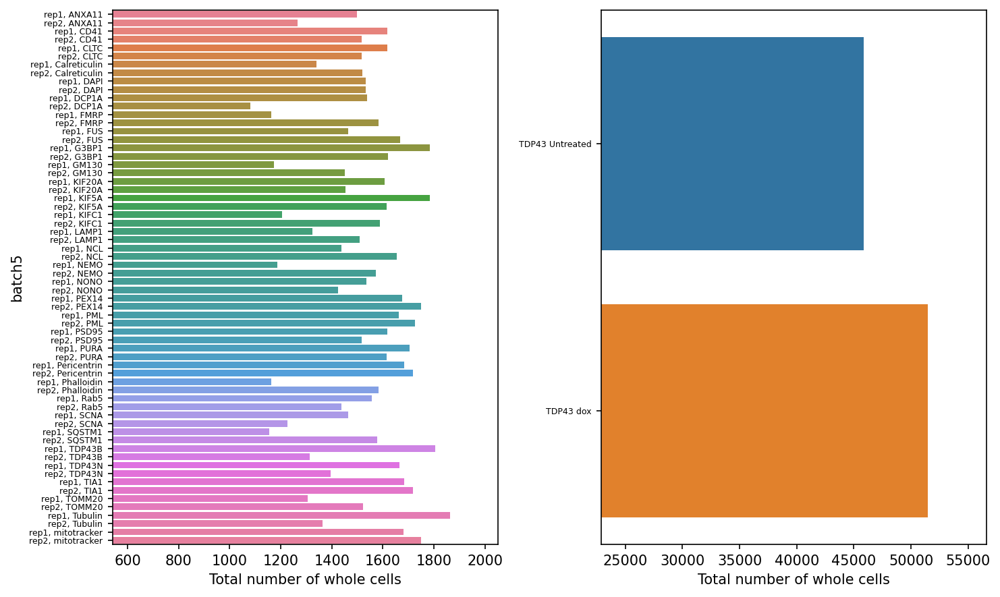

In [43]:
to_heatmap = total_sum.rename(columns={'site_whole_cells_counts_sum':'index'})
plot_filtering_heatmap(to_heatmap, extra_index='marker', vmin=None, vmax=None,
                      xlabel = 'Total number of whole cells', show_sum=True, figsize=(3,8))

### Show **Cell Count** Statistics per Batch

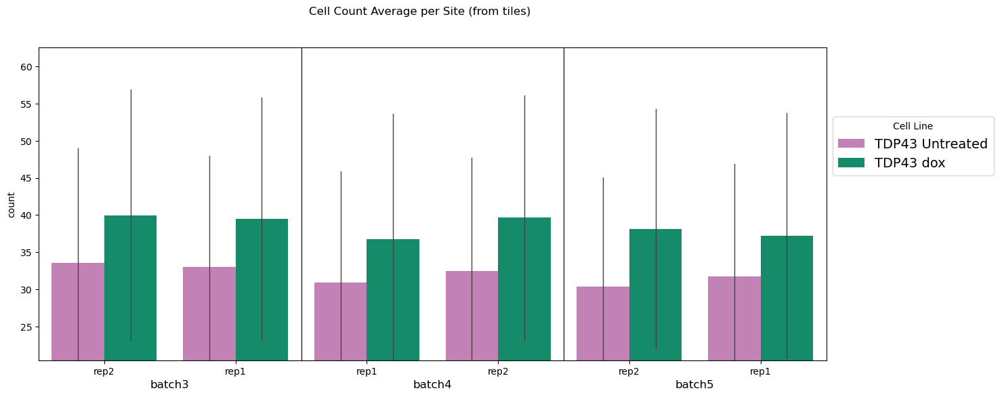

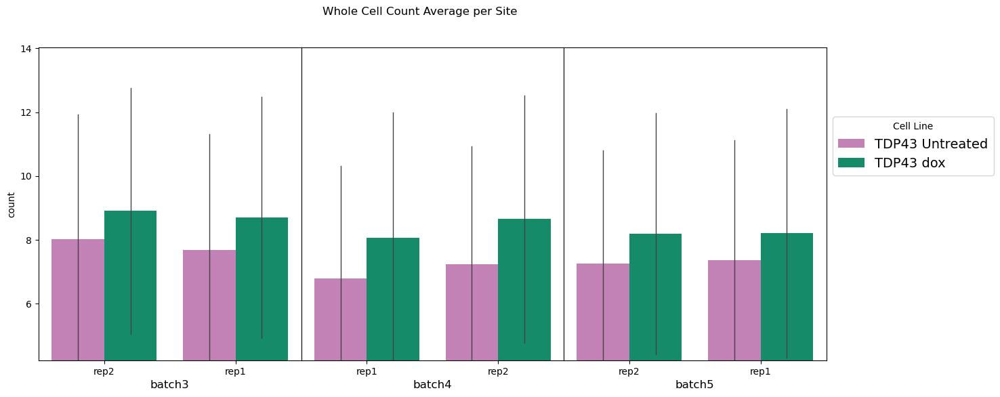

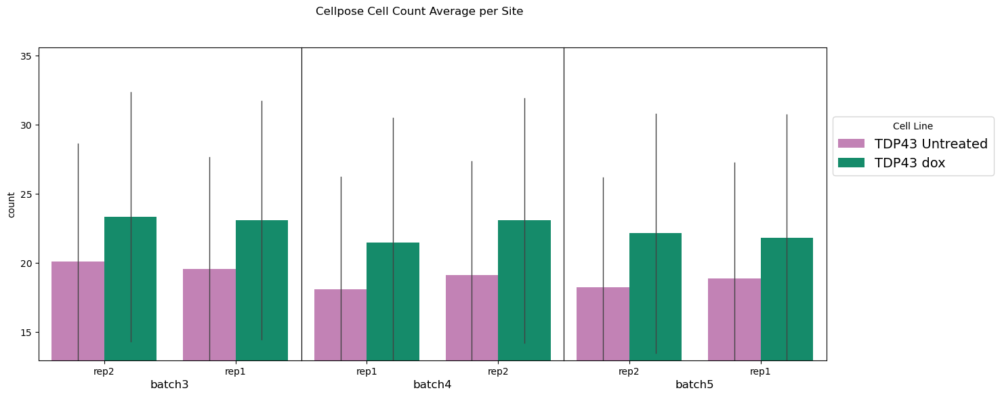

In [44]:
df_no_empty_sites = df_dapi[df_dapi.n_valid_tiles !=0]
plot_cell_count(df_no_empty_sites, dnls_lines_order, dnls_custom_palette, y='site_cell_count_sum', 
                title='Cell Count Average per Site (from tiles)')

plot_cell_count(df_no_empty_sites, dnls_lines_order, dnls_custom_palette, y='site_whole_cells_counts_sum',
                title='Whole Cell Count Average per Site')

plot_cell_count(df_no_empty_sites, dnls_lines_order, dnls_custom_palette, y='site_cell_count',
               title='Cellpose Cell Count Average per Site')


### Show **Tiles** per Site Statistics


In [45]:
df_dapi.groupby(['cell_line_cond']).n_valid_tiles.mean()

cell_line_cond
TDP43 Untreated    6.463026
TDP43 dox          7.486036
Name: n_valid_tiles, dtype: float64

In [46]:
df_dapi[['site_cell_count']].mean()

site_cell_count    20.605392
dtype: float64

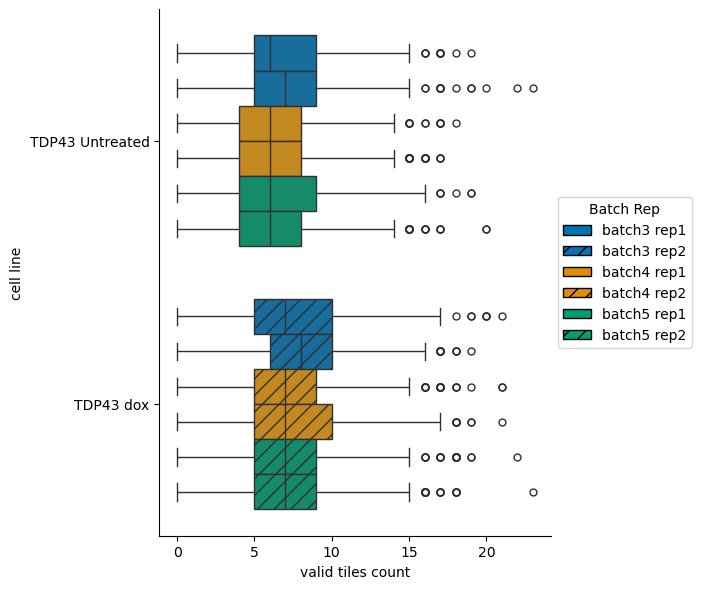

In [50]:
plot_catplot(df_dapi, custom_palette,reps, x='n_valid_tiles', x_title='valid tiles count', batch_min=3, batch_max=5, height=6)


### Show Mean of cell count in valid tiles

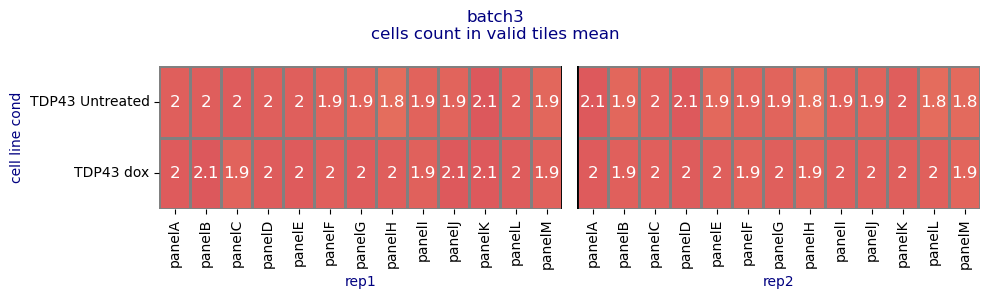

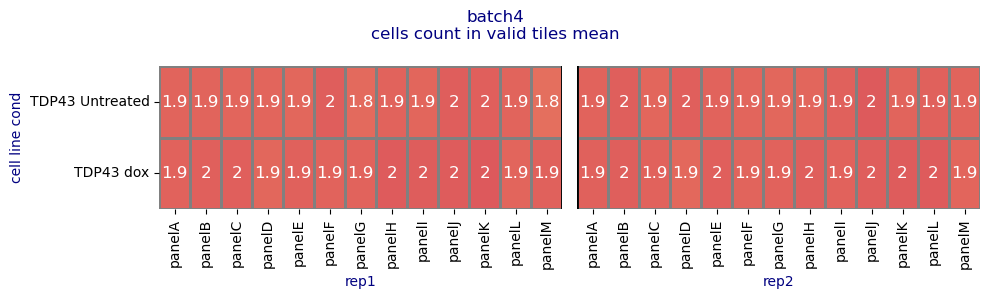

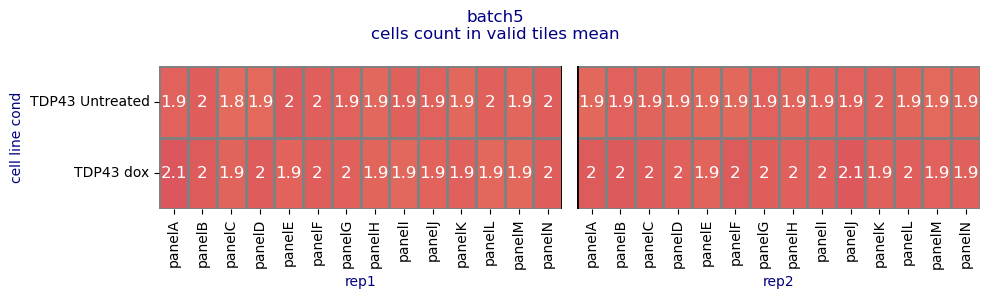

In [59]:
plot_hm(df_dapi, split_by='rep', rows='cell_line_cond', columns='panel', figsize=(10,3))


# Assessing Staining Reproducibility and Outliers

In [61]:
dnls_cell_lines_for_disp

{'TDP43_dox': 'TDP43_dox', 'TDP43_Untreated': 'TDP43_Untreated'}

batch3


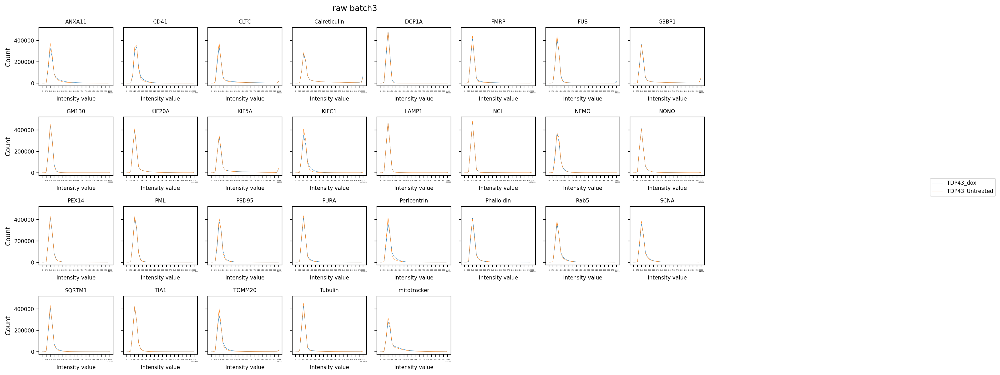

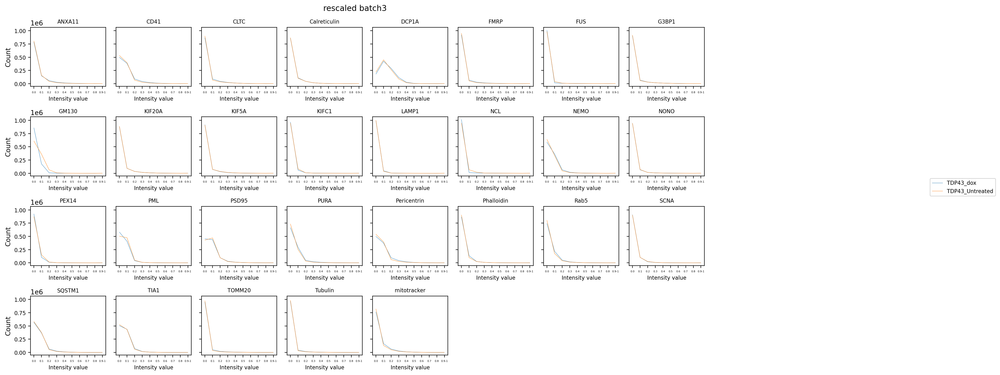

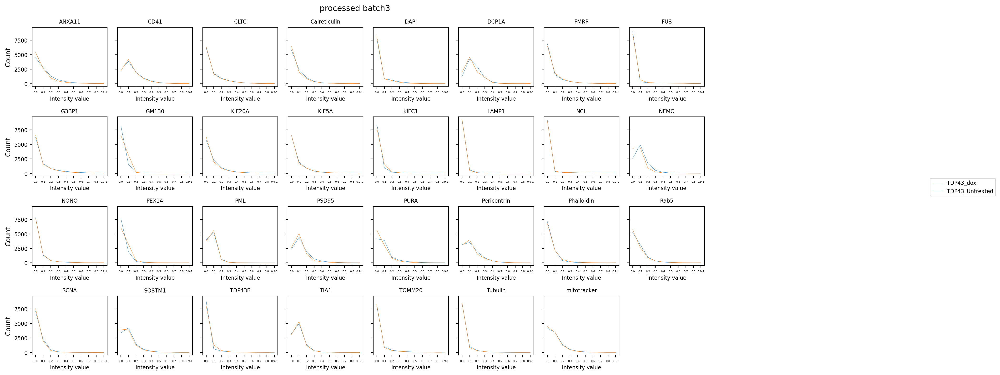

batch4


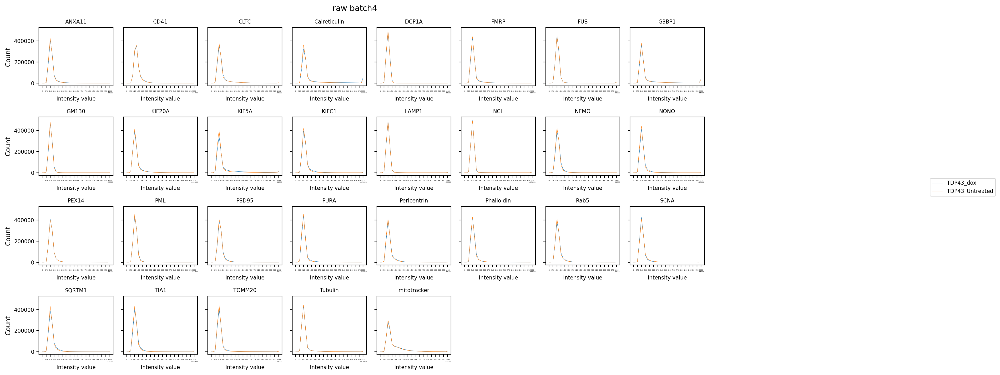

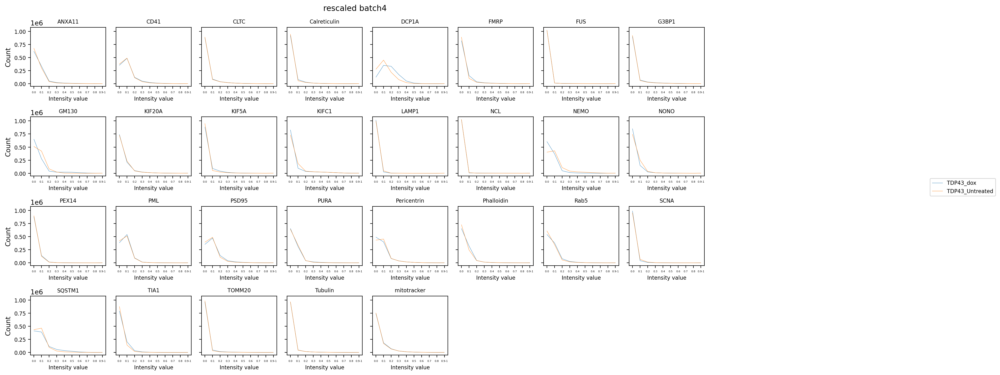

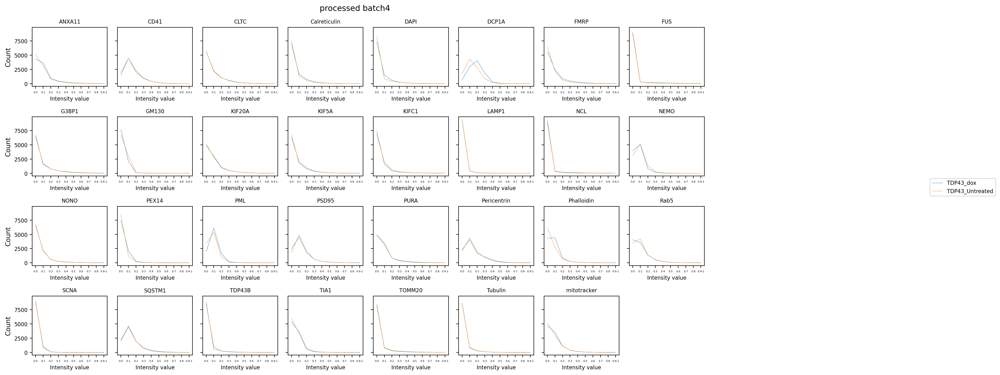

batch5


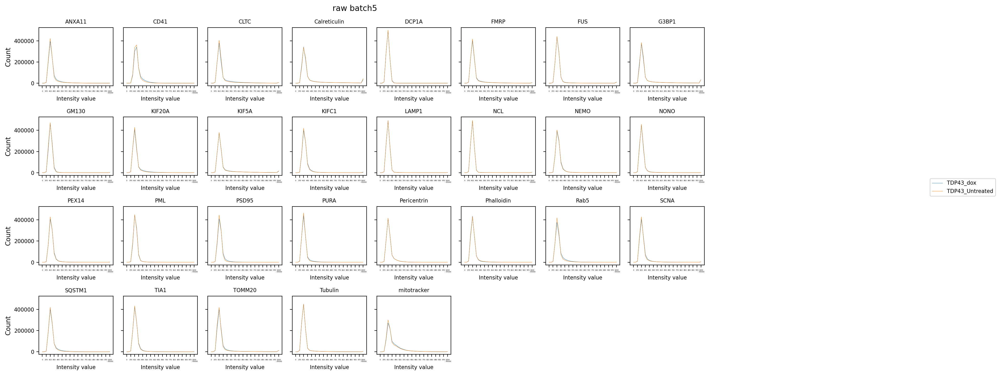

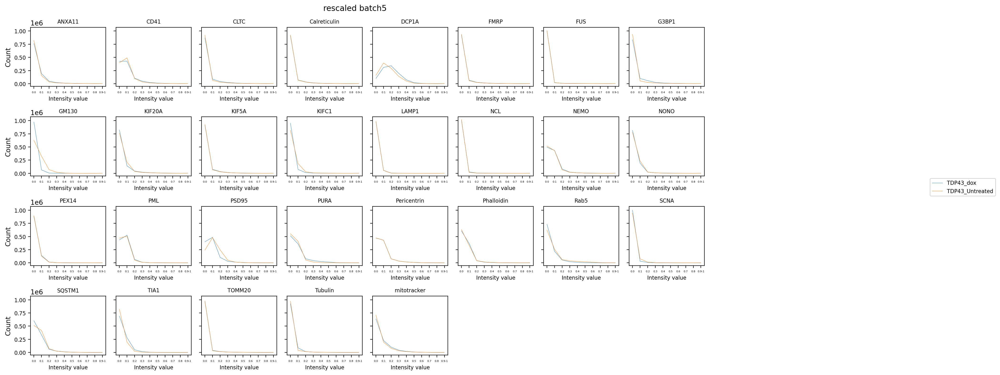

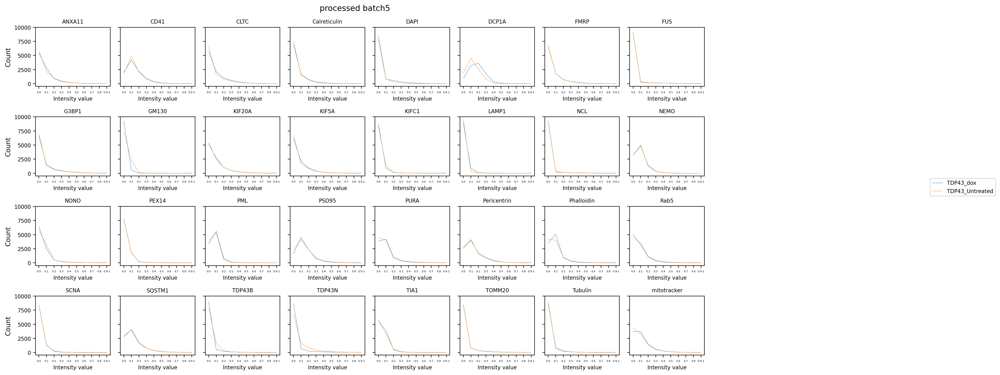

In [64]:
for batch in batches:
    print(batch)
    run_calc_hist_new(f'{batch}', dnls_cell_lines_for_disp, dnls_markers,
                      root_directory_raw, root_directory_proc,
                           hist_sample=10,sample_size_per_markers=200, ncols=8, nrows=4, dnls=True)
    print("="*30)

In [65]:
# save notebook as HTML ( the HTML will be saved in the same folder the original script is)
from IPython.display import display, Javascript
display(Javascript('IPython.notebook.save_checkpoint();'))
os.system(f'jupyter nbconvert --to html tools/preprocessing_tools/qc_reports/qc_report_dNLS.ipynb --output {NOVA_HOME}/manuscript/preprocessing_qc_reports/qc_report_dNLS.html')

<IPython.core.display.Javascript object>

[NbConvertApp] Converting notebook tools/preprocessing_tools/qc_reports/qc_report_dNLS.ipynb to html
[NbConvertApp] Writing 11087758 bytes to /home/labs/hornsteinlab/Collaboration/MOmaps_Noam/MOmaps/manuscript/preprocessing_qc_reports/qc_report_dNLS.html


0